Downloading the dataset and unzip

In [7]:
!wget https://archive.ics.uci.edu/static/public/908/realwaste.zip

--2024-12-10 16:36:38--  https://archive.ics.uci.edu/static/public/908/realwaste.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘realwaste.zip.3’

realwaste.zip.3         [                <=> ] 656.65M  17.7MB/s    in 89s     

2024-12-10 16:38:08 (7.37 MB/s) - ‘realwaste.zip.3’ saved [688545323]



In [9]:
!unzip /content/realwaste.zip.3 -d /content/dataset

Archive:  /content/realwaste.zip.3
797f4fca27a3a85e4c27131cdb7d9a9a5d72c494
   creating: /content/dataset/realwaste-main/
  inflating: /content/dataset/realwaste-main/README.md  
   creating: /content/dataset/realwaste-main/RealWaste/
   creating: /content/dataset/realwaste-main/RealWaste/Cardboard/
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_1.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_10.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_100.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_101.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_102.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_103.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_104.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_105.jpg  
  inflating: /content/

In [10]:
!apt-get install tree

!tree /content/dataset

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
/content/dataset
└── realwaste-main
    ├── README.md
    └── RealWaste
        ├── Cardboard
        │   ├── Cardboard_100.jpg
        │   ├── Cardboard_101.jpg
        │   ├── Cardboard_102.jpg
        │   ├── Cardboard_103.jpg
        │   ├── Cardboard_104.jpg
        │   ├── Cardboard_105.jpg
        │   ├── Cardboard_106.jpg
        │   ├── Cardboard_107.jpg
        │   ├── Cardboard_108.jpg
        │   ├── Cardboard_109.jpg
        │   ├── Cardboard_10.jpg
        │   ├── Cardboard_110.jpg
        │   ├── Cardboard_111.jpg
        │   ├── Cardboard_112.jpg
        │   ├── Cardboard_113.jpg
        │   ├── Cardboard_114.jpg
        │   ├── Cardboard_115.jpg
        │   ├── Cardboard_116.jpg
        │   ├── Cardboard_117.jpg
        │   ├── Cardboard_118.jpg
        │   ├── Card

In [11]:
import os

def count_images_in_folders(root_path):
    """
    Count the number of image files in each subfolder under the given root directory.

    Parameters:
    - root_path: The directory containing class subfolders.

    Returns:
    - A dictionary with folder names as keys and image counts as values.
    """
    folder_counts = {}

    # Iterate through each subfolder
    for folder in os.listdir(root_path):
        folder_path = os.path.join(root_path, folder)

        # Check if it's a directory
        if os.path.isdir(folder_path):
            # Count files with image extensions
            count = sum(
                1 for file in os.listdir(folder_path)
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))
            )
            folder_counts[folder] = count

    return folder_counts


if __name__ == "__main__":
    root_path = "/content/dataset/realwaste-main/RealWaste"
    counts = count_images_in_folders(root_path)

    for folder, count in counts.items():
        print(f"{folder}: {count} images")


Food Organics: 411 images
Cardboard: 461 images
Plastic: 921 images
Vegetation: 436 images
Glass: 420 images
Textile Trash: 318 images
Paper: 500 images
Metal: 790 images
Miscellaneous Trash: 495 images


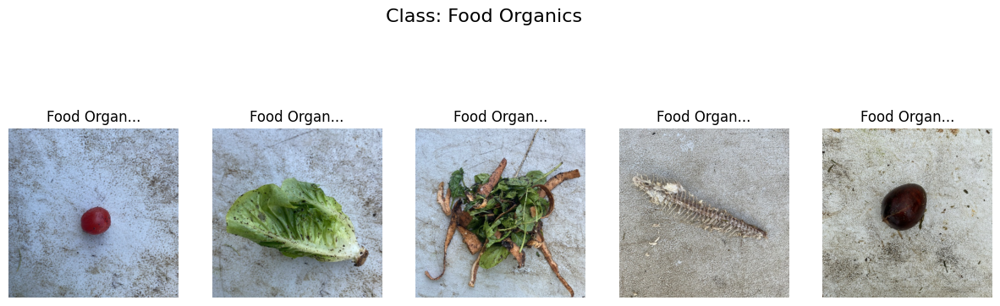

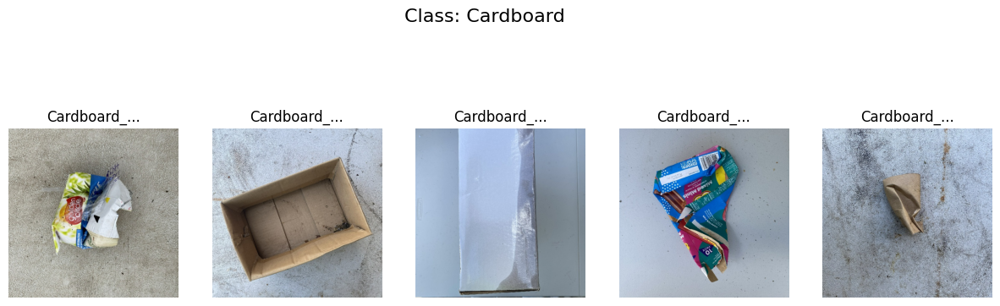

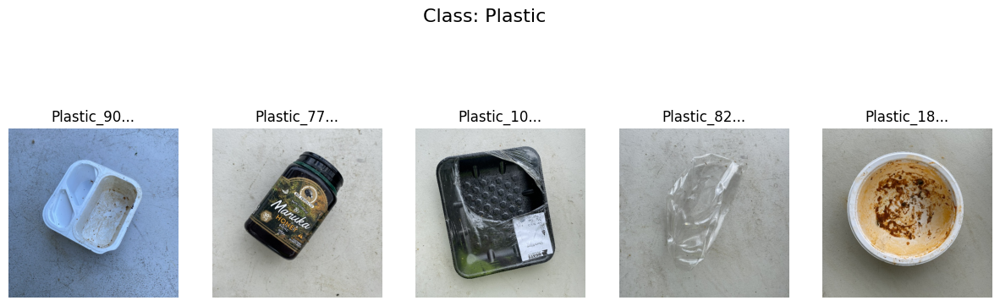

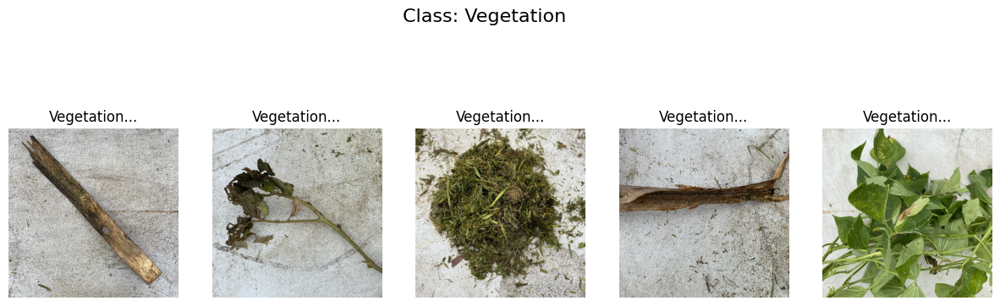

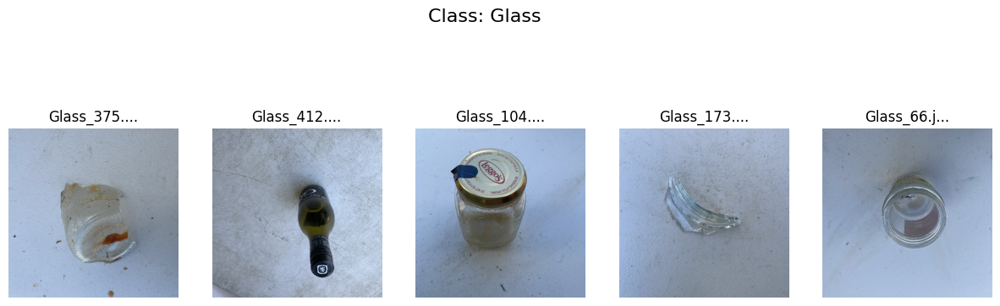

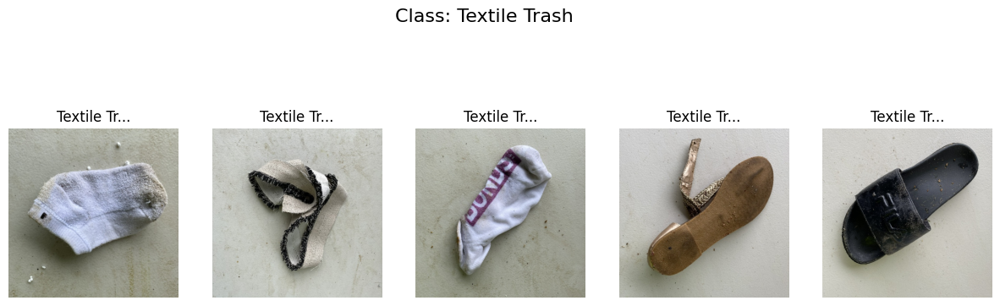

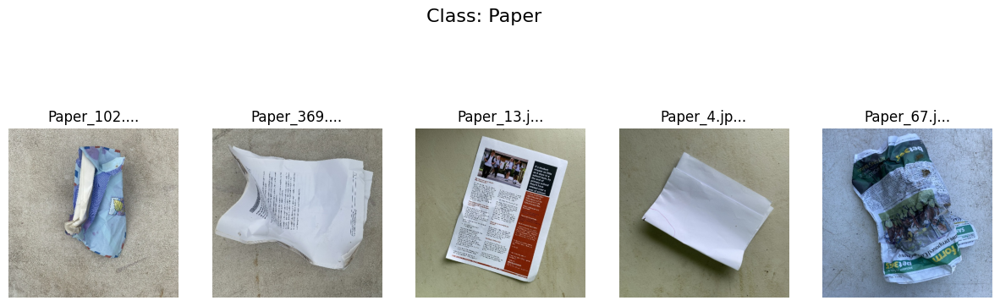

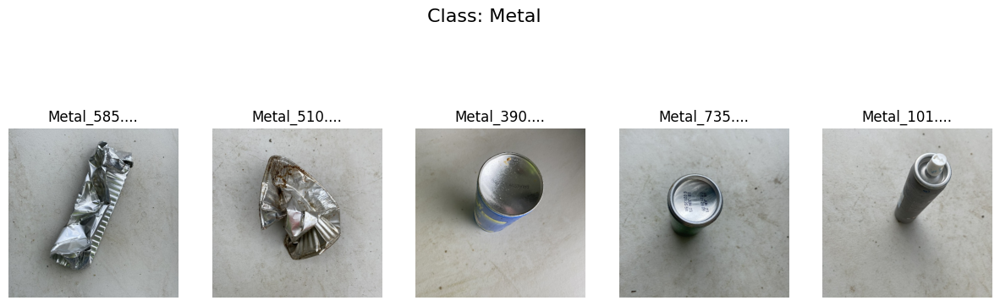

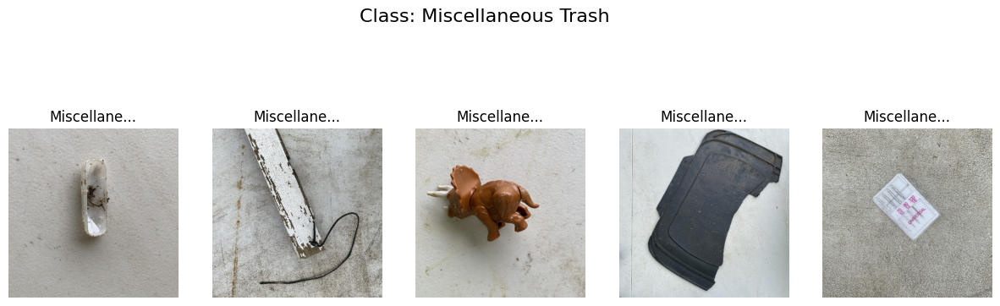

In [12]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_random_images(root_path, num_images=5):
    """
    Visualize a specified number of random images from each class folder.

    Parameters:
    - root_path: The directory containing class subfolders.
    - num_images: The number of images to display per class.
    """
    # List all class folders
    class_folders = [folder for folder in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, folder))]

    for class_name in class_folders:
        class_path = os.path.join(root_path, class_name)
        image_files = [
            f for f in os.listdir(class_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))
        ]

        # Select random images
        random_images = random.sample(image_files, min(num_images, len(image_files)))

        # Plot the images
        plt.figure(figsize=(15, 5))
        plt.suptitle(f"Class: {class_name}", fontsize=16)

        for i, image_name in enumerate(random_images):
            image_path = os.path.join(class_path, image_name)
            image = Image.open(image_path)

            plt.subplot(1, num_images, i + 1)
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"{image_name[:10]}...")  # Truncate title if too long

        plt.show()


if __name__ == "__main__":
    dataset_path = "/content/dataset/realwaste-main/RealWaste"
    visualize_random_images(dataset_path, num_images=5)


In [13]:
import os
from PIL import Image

def inspect_dataset(dataset_path):
    stats = {
        "total_images": 0,
        "image_sizes": set(),  # Unique image dimensions (width, height)
        "file_types": set(),   # Unique file extensions
        "color_modes": set(),  # Unique color modes (e.g., RGB, Grayscale)
    }

    # Traverse dataset directory
    for root, dirs, files in os.walk(dataset_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                with Image.open(file_path) as img:
                    stats["total_images"] += 1
                    stats["image_sizes"].add(img.size)  # Add image dimensions
                    stats["file_types"].add(file_name.split('.')[-1].lower())  # Add file extension
                    stats["color_modes"].add(img.mode)  # Add color mode (e.g., RGB, L)
            except Exception as e:
                print(f"Error loading image: {file_path}, {e}")

    return stats

# Example usage
dataset_path = "/content/dataset/realwaste-main/RealWaste"  # Base directory
stats = inspect_dataset(dataset_path)

print("Total Images:", stats["total_images"])
print("Unique Image Sizes:", stats["image_sizes"])
print("File Types:", stats["file_types"])
print("Color Modes:", stats["color_modes"])


Total Images: 4752
Unique Image Sizes: {(524, 524)}
File Types: {'jpg'}
Color Modes: {'RGB'}


In [14]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def compute_mean_std(dataset_path):
    means = np.zeros(3)  # For RGB channels (R, G, B)
    stds = np.zeros(3)
    total_pixels = 0

    for root, dirs, files in os.walk(dataset_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                with Image.open(file_path) as img:
                    img = img.convert("RGB")  # Ensure all images are RGB
                    img_array = np.array(img)  # Convert to NumPy array
                    img_array = img_array / 255.0  # Normalize to [0, 1]

                    # Compute stats for the current image
                    pixels = img_array.shape[0] * img_array.shape[1]
                    total_pixels += pixels

                    means += img_array.reshape(-1, 3).sum(axis=0)  # Sum over color channels
                    stds += (img_array.reshape(-1, 3) ** 2).sum(axis=0)
            except Exception as e:
                print(f"Error processing image {file_path}: {e}")

    # Compute final means and standard deviations
    means /= total_pixels
    stds = np.sqrt(stds / total_pixels - means**2)  # Variance = E[X^2] - (E[X])^2

    return means, stds


# Example usage
dataset_path = "/content/dataset/realwaste-main/RealWaste"  # Replace with your dataset path
mean, std = compute_mean_std(dataset_path)

print("Mean (R, G, B):", mean)
print("Standard Deviation (R, G, B):", std)




Mean (R, G, B): [0.59794334 0.61907829 0.63169037]
Standard Deviation (R, G, B): [0.17513545 0.17597847 0.19797813]


Mean (R, G, B): [0.59794334 0.61907829 0.63169037]
Standard Deviation (R, G, B): [0.17513545 0.17597847 0.19797813]


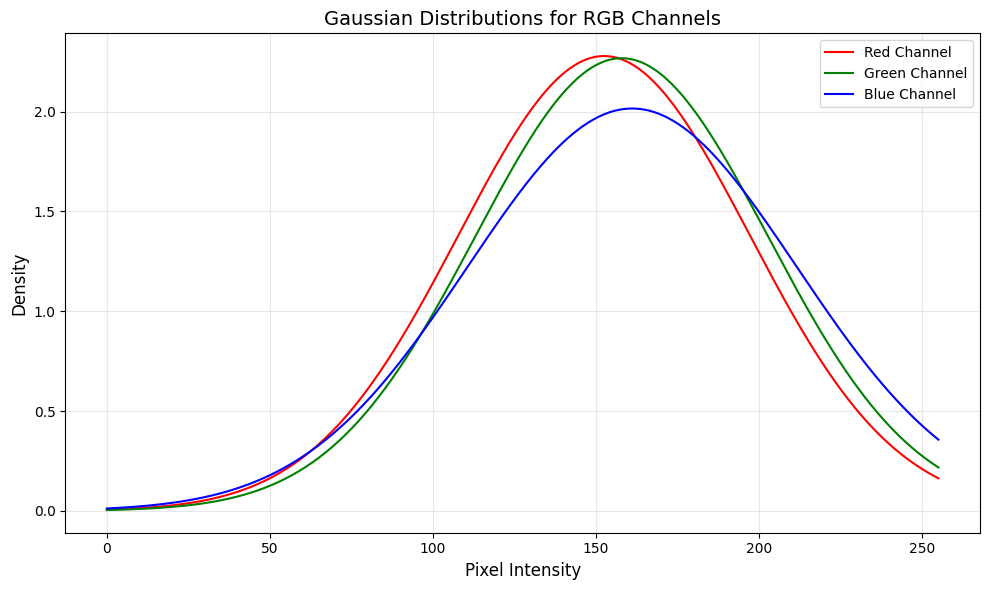

In [15]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def compute_mean_std(dataset_path):
    means = np.zeros(3)  # For RGB channels (R, G, B)
    stds = np.zeros(3)
    total_pixels = 0

    for root, dirs, files in os.walk(dataset_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                with Image.open(file_path) as img:
                    img = img.convert("RGB")  # Ensure all images are RGB
                    img_array = np.array(img)  # Convert to NumPy array
                    img_array = img_array / 255.0  # Normalize to [0, 1]

                    # Compute stats for the current image
                    pixels = img_array.shape[0] * img_array.shape[1]
                    total_pixels += pixels

                    means += img_array.reshape(-1, 3).sum(axis=0)  # Sum over color channels
                    stds += (img_array.reshape(-1, 3) ** 2).sum(axis=0)
            except Exception as e:
                print(f"Error processing image {file_path}: {e}")

    # Compute final means and standard deviations
    means /= total_pixels
    stds = np.sqrt(stds / total_pixels - means**2)  # Variance = E[X^2] - (E[X])^2

    return means, stds

def plot_gaussian_distributions(mean, std):
    mean = list(mean)
    std = list(std)
    colors = ['red', 'green', 'blue']  # Colors for the RGB distributions
    labels = ['Red Channel', 'Green Channel', 'Blue Channel']

    # Generate x values for the Gaussian distributions
    x = np.linspace(0, 255, 500)  # Pixel intensity range

    plt.figure(figsize=(10, 6))

    # Plot each Gaussian distribution
    for mean_val, std_val, color, label in zip(mean, std, colors, labels):
        y = (1 / (std_val * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mean_val * 255) / (std_val * 255)) ** 2)
        plt.plot(x, y, color=color, label=label)

    # Add plot details
    plt.title('Gaussian Distributions for RGB Channels', fontsize=14)
    plt.xlabel('Pixel Intensity', fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# Example usage
dataset_path = "/content/dataset/realwaste-main/RealWaste"  # Replace with your dataset path
mean, std = compute_mean_std(dataset_path)

print("Mean (R, G, B):", mean)
print("Standard Deviation (R, G, B):", std)

# Plot the Gaussian distributions
plot_gaussian_distributions(mean, std)


In [21]:
import os
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image

class WasteDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (str): Directory with all the images, organized by subfolders for each class.
            transform (callable, optional): Optional transform to be applied on an image.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.image_paths = []
        self.labels = []

        # Collect image paths and labels
        for label_idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(root_dir, class_name)
            for img_file in os.listdir(class_dir):
                self.image_paths.append(os.path.join(class_dir, img_file))
                self.labels.append(label_idx)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        with Image.open(img_path) as img:
            img = img.convert("RGB")  # Ensure RGB format
            if self.transform:
                img = self.transform(img)

        return img, label

# Define dataset paths
dataset_path = "/content/dataset/realwaste-main/RealWaste"

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a fixed size
    transforms.ToTensor(),          # Convert image to PyTorch tensor and normalize to [0, 1]
    transforms.Normalize(mean, std) # Normalize using calculated mean and std
])

# Create the dataset
dataset = WasteDataset(dataset_path, transform=transform)

# Calculate split sizes
dataset_size = len(dataset)
train_size = int(0.6 * dataset_size)
val_size = int(0.2 * dataset_size)
test_size = dataset_size - train_size - val_size

# Split the dataset
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Print dataset sizes
print(f"Total dataset size: {dataset_size}")
print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")


Total dataset size: 4752
Training set size: 2851
Validation set size: 950
Test set size: 951


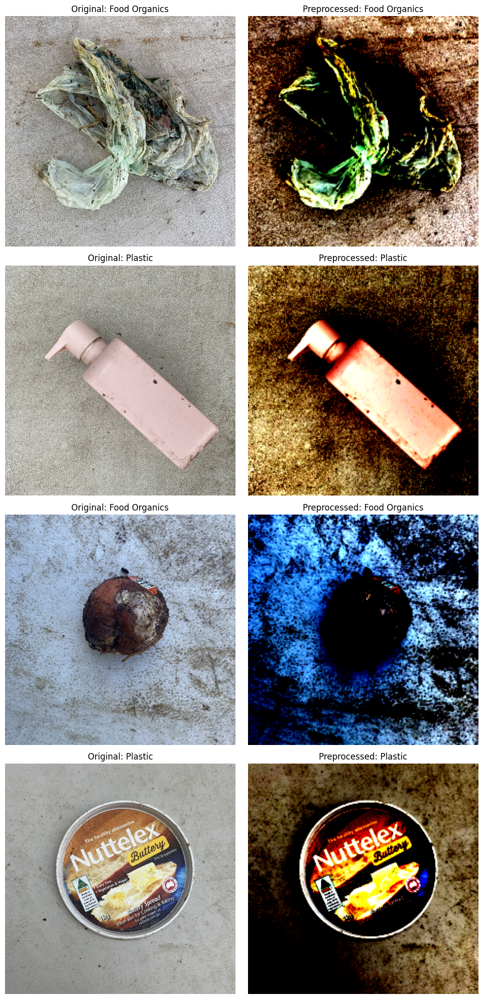

In [ ]:
# Function to display original and preprocessed images
def visualize_random_images(dataset, num_images=4):
    fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 5))
    axes = axes.flatten()

    # Select random indices from the dataset
    random_indices = random.sample(range(len(dataset)), num_images)

    for i, idx in enumerate(random_indices):
        img, label = dataset[idx]

        # Get the original image path and load the original image
        original_img_path = dataset.image_paths[idx]
        original_img = Image.open(original_img_path).convert("RGB")

        # Plot original image
        axes[i * 2].imshow(original_img)
        axes[i * 2].set_title(f"Original: {dataset.classes[label]}")
        axes[i * 2].axis('off')

        # Plot preprocessed image (transformed)
        axes[i * 2 + 1].imshow(img.permute(1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
        axes[i * 2 + 1].set_title(f"Preprocessed: {dataset.classes[label]}")
        axes[i * 2 + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
visualize_random_images(dataset)

In [18]:
import torch.nn as nn
import torch.nn.functional as F

class EnhancedCNN(nn.Module):
    def __init__(self, num_classes):
        super(EnhancedCNN, self).__init__()

        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # Input: (3, 224, 224) -> Output: (32, 224, 224)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1) # Input: (32, 224, 224) -> Output: (64, 112, 112)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)       # Pooling: -> Output: (64, 112, 112)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # Input: (64, 112, 112) -> Output: (128, 112, 112)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)# Input: (128, 112, 112) -> Output: (256, 56, 56)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)        # Pooling: -> Output: (256, 56, 56)

        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1) # Input: (256, 56, 56) -> Output: (512, 56, 56)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)         # Pooling: -> Output: (512, 28, 28)

        # Flatten layer
        self.flatten = nn.Flatten() # Output: 512 * 28 * 28 = 401408

        # Fully connected layers
        self.fc1 = nn.Linear(512 * 28 * 28, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, 256)
        self.dropout = nn.Dropout(0.5)  # Dropout for regularization
        self.fc4 = nn.Linear(256, num_classes)  # Output layer

    def forward(self, x):
        # Convolutional and pooling layers
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.pool1(x)

        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.pool2(x)

        x = F.relu(self.conv5(x))
        x = self.pool3(x)

        # Fully connected layers
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.relu(self.fc3(x))
        x = self.fc4(x)

        return x

# Initialize model
num_classes = 9  # Number of classes
model = EnhancedCNN(num_classes)
print(model)


EnhancedCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=401408, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=512, bias=True)
  (fc3): Linear(in_features=512, out_features=256, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc4): Linear(in_features=256, out_features=9, bias=True)


Epoch 1/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Epoch 1: Best model saved with validation loss: 1.7555
Epoch [1/20], Train Loss: 1.9997, Val Loss: 1.7555


Epoch 2/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.19it/s]


Epoch 2: Best model saved with validation loss: 1.5959
Epoch [2/20], Train Loss: 1.6539, Val Loss: 1.5959


Epoch 3/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.15it/s]


Epoch 3: Best model saved with validation loss: 1.4829
Epoch [3/20], Train Loss: 1.4811, Val Loss: 1.4829


Epoch 4/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.15it/s]


Epoch 4: Best model saved with validation loss: 1.3473
Epoch [4/20], Train Loss: 1.3650, Val Loss: 1.3473


Epoch 5/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.30it/s]


Epoch [5/20], Train Loss: 1.2189, Val Loss: 1.3643


Epoch 6/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Epoch 6: Best model saved with validation loss: 1.3415
Epoch [6/20], Train Loss: 1.0489, Val Loss: 1.3415


Epoch 7/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.15it/s]


Epoch 7: Best model saved with validation loss: 1.2378
Epoch [7/20], Train Loss: 0.9648, Val Loss: 1.2378


Epoch 8/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.14it/s]


Epoch [8/20], Train Loss: 0.8016, Val Loss: 1.3709


Epoch 9/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Epoch [9/20], Train Loss: 0.6516, Val Loss: 1.6322


Epoch 10/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.18it/s]


Epoch [10/20], Train Loss: 0.4662, Val Loss: 1.5952


Epoch 11/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.09it/s]


Epoch [11/20], Train Loss: 0.3841, Val Loss: 1.7584


Epoch 12/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.25it/s]


Epoch [12/20], Train Loss: 0.3236, Val Loss: 1.8550


Epoch 13/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.18it/s]


Epoch [13/20], Train Loss: 0.2012, Val Loss: 2.4263


Epoch 14/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.23it/s]


Epoch [14/20], Train Loss: 0.1980, Val Loss: 1.9494


Epoch 15/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.10it/s]


Epoch [15/20], Train Loss: 0.1737, Val Loss: 2.0245


Epoch 16/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.20it/s]


Epoch [16/20], Train Loss: 0.1108, Val Loss: 2.1566


Epoch 17/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Epoch [17/20], Train Loss: 0.1296, Val Loss: 1.9133


Epoch 18/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.25it/s]


Epoch [18/20], Train Loss: 0.1071, Val Loss: 2.2999


Epoch 19/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.02it/s]


Epoch [19/20], Train Loss: 0.1098, Val Loss: 2.2482


Epoch 20/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.20it/s]
<ipython-input-24-cfc0e4e15d33>:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

Epoch [20/20], Train Loss: 0.0610, Val Loss: 2.6550
Best model loaded with validation loss: 1.2378477036952973


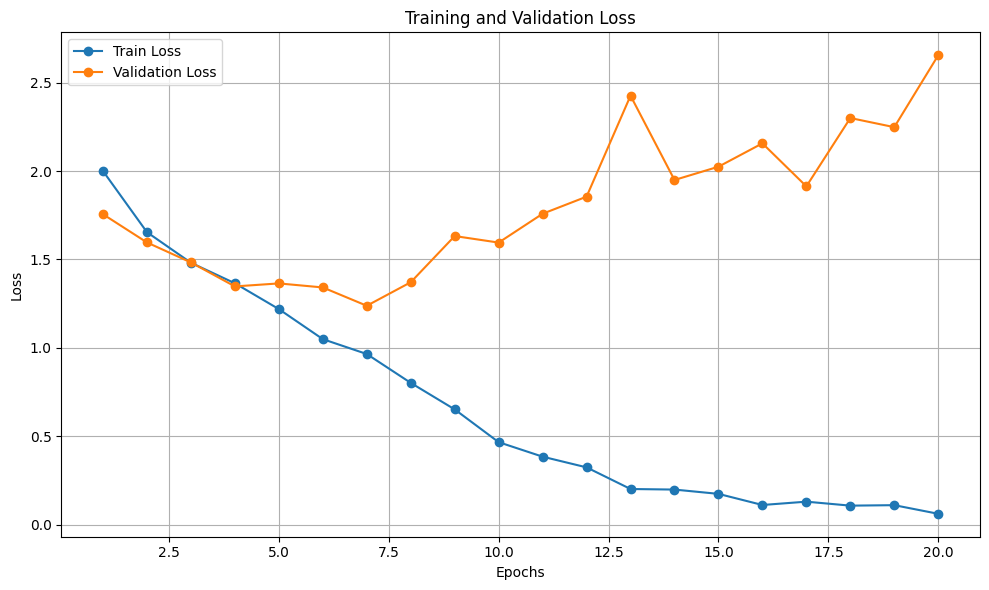

In [24]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm

# Assuming the DataLoader and model setup is already complete
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
num_epochs = 20
learning_rate = 0.001

# Define model, criterion, and optimizer
model = EnhancedCNN(num_classes=len(dataset.classes)).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Initialize variables to track training
best_val_loss = float('inf')
best_model_path = "best_model.pth"
train_losses = []
val_losses = []

# Training loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    train_loss = 0.0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]"):
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # Validation phase
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Epoch {epoch+1}: Best model saved with validation loss: {val_loss:.4f}")

    # Print losses
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# After training, load the best model
model.load_state_dict(torch.load(best_model_path))
print("Best model loaded with validation loss:", best_val_loss)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss", marker='o')
plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", marker='o')
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


In [27]:
import torch

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load the best model weights and move the model to the appropriate device
model = EnhancedCNN(num_classes=num_classes)  # Ensure the same architecture as the saved model
model.load_state_dict(torch.load('best_model.pth', map_location=device))  # Map weights to the current device
model.to(device)  # Move model to the selected device
model.eval()  # Set the model to evaluation mode

# Initialize variables for accuracy calculation
correct = 0
total = 0

# Disable gradient computation for evaluation
with torch.no_grad():
    for images, labels in test_loader:  # Iterate through the test DataLoader
        images, labels = images.to(device), labels.to(device)  # Move data to the same device as the model

        # Forward pass: Get predictions
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)  # Get the class with the highest score

        # Update counts
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

# Calculate and print accuracy
accuracy = 100 * correct / total
print(f"Test Accuracy of the model: {accuracy:.2f}%")


Using device: cuda


<ipython-input-27-32a74e074532>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth', map_location=device))  # Map weights to t

Test Accuracy of the model: 56.36%


# **2 Compareyournetwork with state-of-the-art networks**


Training ResNet18...

Epoch [1/20], Train Loss: 1.2187, Val Loss: 1.1897
Epoch [2/20], Train Loss: 0.7572, Val Loss: 2.9813
Epoch [3/20], Train Loss: 0.7321, Val Loss: 1.3188
Epoch [4/20], Train Loss: 0.6432, Val Loss: 1.1889
Epoch [5/20], Train Loss: 0.4490, Val Loss: 0.9626
Epoch [6/20], Train Loss: 0.4145, Val Loss: 0.8486
Epoch [7/20], Train Loss: 0.3663, Val Loss: 0.8559
Epoch [8/20], Train Loss: 0.1471, Val Loss: 0.9276
Epoch [9/20], Train Loss: 0.1135, Val Loss: 1.1119
Epoch [10/20], Train Loss: 0.4444, Val Loss: 0.8223
Epoch [11/20], Train Loss: 0.1513, Val Loss: 0.6777
Epoch [12/20], Train Loss: 0.2785, Val Loss: 0.8025
Epoch [13/20], Train Loss: 0.0995, Val Loss: 0.9256
Epoch [14/20], Train Loss: 0.0901, Val Loss: 1.0987
Epoch [15/20], Train Loss: 0.0485, Val Loss: 0.7653
Epoch [16/20], Train Loss: 0.1855, Val Loss: 1.2164
Epoch [17/20], Train Loss: 0.2936, Val Loss: 1.0333
Epoch [18/20], Train Loss: 0.1614, Val Loss: 0.8106
Epoch [19/20], Train Loss: 0.1569, Val Loss: 0.840

<ipython-input-29-68ba1652cef9>:87: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{model_name}_best.pth"))


ResNet18 Test Accuracy: 81.60%
VGG16 Test Accuracy: 62.78%


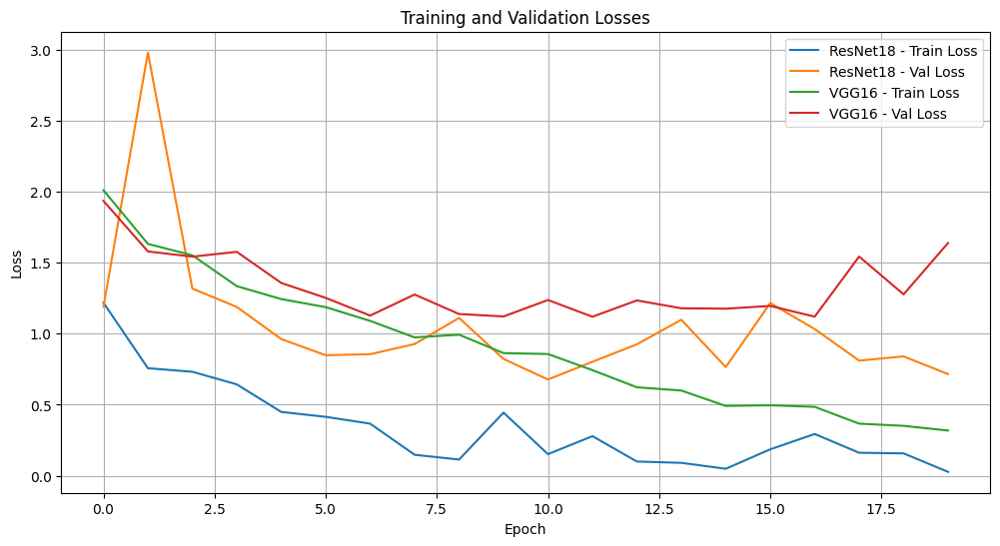


Final Test Accuracies:
ResNet18: 81.60%
VGG16: 62.78%


In [29]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Number of classes
num_classes = len(dataset.classes)

# Load pre-trained models
models_to_train = {
    "ResNet18": models.resnet18(pretrained=True),
    "VGG16": models.vgg16(pretrained=True)
}

# Modify the last layer for the number of classes
for model_name, model in models_to_train.items():
    if model_name == "ResNet18":
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "VGG16":
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_classes)
    model.to(device)

# Training parameters
num_epochs = 20
criterion = nn.CrossEntropyLoss()
batch_size = 32
learning_rate = 0.001

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Train and validate each model
results = {}
for model_name, model in models_to_train.items():
    print(f"\nTraining {model_name}...\n")

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Record losses
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        # Training
        model.train()
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        train_losses.append(running_loss / len(train_loader))

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
        val_losses.append(val_loss / len(val_loader))

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}")

    # Save the training and validation losses
    results[model_name] = {"train_losses": train_losses, "val_losses": val_losses}

    # Save the best model
    torch.save(model.state_dict(), f"{model_name}_best.pth")

# Evaluate models on the test set
test_accuracies = {}
for model_name, model in models_to_train.items():
    # Load the best model
    model.load_state_dict(torch.load(f"{model_name}_best.pth"))
    model.eval()

    # Test accuracy
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    accuracy = 100 * correct / total
    test_accuracies[model_name] = accuracy
    print(f"{model_name} Test Accuracy: {accuracy:.2f}%")

# Plot training and validation losses
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
for model_name, data in results.items():
    plt.plot(data["train_losses"], label=f"{model_name} - Train Loss")
    plt.plot(data["val_losses"], label=f"{model_name} - Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Losses")
plt.legend()
plt.grid()
plt.show()

# Print final test accuracies
print("\nFinal Test Accuracies:")
for model_name, accuracy in test_accuracies.items():
    print(f"{model_name}: {accuracy:.2f}%")
